# **Image/video processing 101**
A starting set of useful utilities for handling image and video data.

This workshop provides a set of introductory image/video processing techniques. Useful python libraries:


*   [OpenCV](https://opencv.org/) : Useful library for image and video processing 

* [Scikit-image](https://scipy-lectures.org/packages/scikit-image/index.html#non-local-filters) : Useful library based on scipy and numpy for image and video processing

*   [Numpy](https://numpy.org/): Useful library for handling matrices

*   [Pandas](https://pandas.pydata.org/): Useful library for handling tabular data
*   [Matplotlib](https://matplotlib.org/): Useful library for plotting/visualization.



# Step 1: Introduction to images 





## Concept of pixels 

Images are stored as rectangular arrays of multiple discrete “picture elements,” also known as pixels. Each pixel can be considered as a single square point of colored light. 

Consider the following picture of Yosemite National Park:

<div>
<img src="https://www.tripsavvy.com/thmb/3it2GRMqxoxpTWtisl8QK0hbGEE=/3424x2568/smart/filters:no_upscale()/yosemite-falls-yosemite-national-park-california-usa-683750029-58b0dfc75f9b5860462db5b0.jpg" width="400">
</div>






We zoom into the image near the top of the waterfall. The zoomed image gives us a sense of pixels in an image. All the small squares in the image are pixels.
![picture](https://drive.google.com/uc?id=1lu-HP0UH6VMczegt02vEVhDfmYvV9QPG)

## Image convention

The coordinate system of images will have positive coordinates (no negative coordinates !). The origin is located at the top left corner and the y coordinate values will become larger, as one goes down. This is called the **left handed coordinate system**.
![picture](https://drive.google.com/uc?id=1hTtnxpsxGhsvdQOxBtRkoytRv4t0lSHw)

## Image Formats


## Color Spaces

# Step 2: Handling the libraries


## Installing libraries 
Use pip install for installing the python libraries.

Use the command !pip install <library>




In [110]:
!pip install numpy 

In [111]:
!pip install opencv-python #Installing opencv 

In [112]:
!pip install pandas
!pip install matplotlib

## Import libraries 


In [113]:
import cv2 
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
from skimage import io
from google.colab.patches import cv2_imshow
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import skimage
import skimage.viewer

# Step 3: Getting the data 

## Download image from url 

Use wget to download a sample image from a link .

Use the command format:  

```
# wget -O <filename> <link>. 
```

This command downloads the image from link to a local filename.


In [114]:
#reading image from an URL 
#url="https://cdn.cherwell.org/wp-content/uploads/2020/01/11141049/frozen-two-still-sparkle.jpg"
!wget -O frozen.jpg https://cdn.cherwell.org/wp-content/uploads/2020/01/11141049/frozen-two-still-sparkle.jpg  #downloading the RGB image
!wget -O dog.jpg https://i.stack.imgur.com/B2DBy.jpg #downloading the black and white image

--2021-02-16 04:22:37--  https://cdn.cherwell.org/wp-content/uploads/2020/01/11141049/frozen-two-still-sparkle.jpg
Resolving cdn.cherwell.org (cdn.cherwell.org)... 65.9.73.63, 65.9.73.9, 65.9.73.13, ...
Connecting to cdn.cherwell.org (cdn.cherwell.org)|65.9.73.63|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 545243 (532K) [image/jpeg]
Saving to: ‘frozen.jpg’

frozen.jpg          100%[===================>] 532.46K  --.-KB/s    in 0.02s   

2021-02-16 04:22:37 (27.7 MB/s) - ‘frozen.jpg’ saved [545243/545243]

--2021-02-16 04:22:37--  https://i.stack.imgur.com/B2DBy.jpg
Resolving i.stack.imgur.com (i.stack.imgur.com)... 151.101.36.193
Connecting to i.stack.imgur.com (i.stack.imgur.com)|151.101.36.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13601 (13K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>]  13.28K  --.-KB/s    in 0s      

2021-02-16 04:22:37 (96.9 MB/s) - ‘dog.jpg’ saved [13601/13601]

In [115]:
ls -ltr # checking whether we have the image here locally

total 556
-rw-r--r-- 1 root root  13601 May  3  2014 dog.jpg
-rw-r--r-- 1 root root 545243 Jan 11  2020 frozen.jpg
drwxr-xr-x 1 root root   4096 Feb 10 14:40 sample_data/


# Step 4: Read/Display Images


## Read the image and display

Read the image using opencv and display it using cv2_imshow functionality.

Images are usually available in two formats:


*   **Grayscale**: Grayscale images are usually in black and white format.
*   **RGB**: RGB images are color images. 

Opencv reads the image in **BGR** format. 



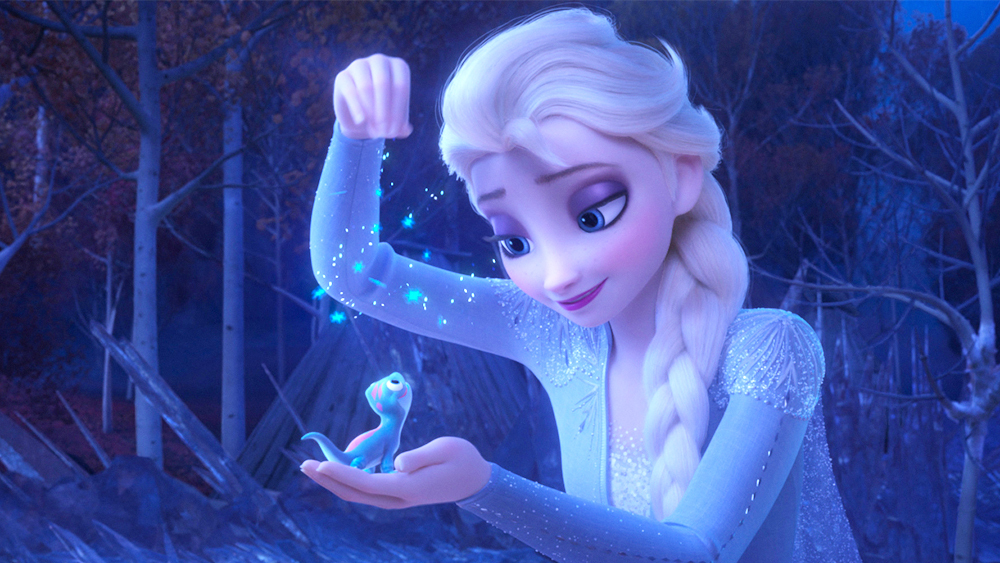

In [116]:
image_RGB_data=cv2.imread('frozen.jpg')
cv2_imshow(image_RGB_data) #displaying the RGB image 
#cv2.imshow crashes in google colab

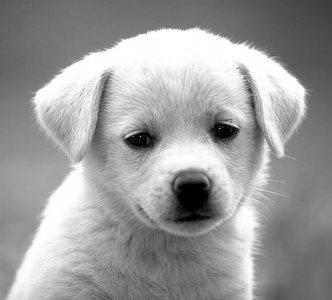

In [117]:
image_BW_data=cv2.imread('dog.jpg')
cv2_imshow(image_BW_data)

## Checking the size and format of the image data 

Opencv reads the image data in numpy matrix .

For RGB images, the data read is a 3D numpy array with format **(height, width,3)**.

For BW images, the data read is a 2D numpy array with format **(height, width)**.

**General format**: (height, width, number of channels)

For RGB, **number of channels=3**.

For BW, **number of channels=1**

In [118]:
print(image_RGB_data.dtype) #data type of the RGB image 
print(image_RGB_data.shape) #shape of the RGB data (height,width,number of channels)
print(image_BW_data.shape)#shape of the grayscale data (height,width)


#access individual pixel values here

uint8
(563, 1000, 3)
(300, 332, 3)


## Conversion of image from RGB to Grayscale

Often, many applications require conversion of RGB data to grayscale format. Following is an example using opencv:

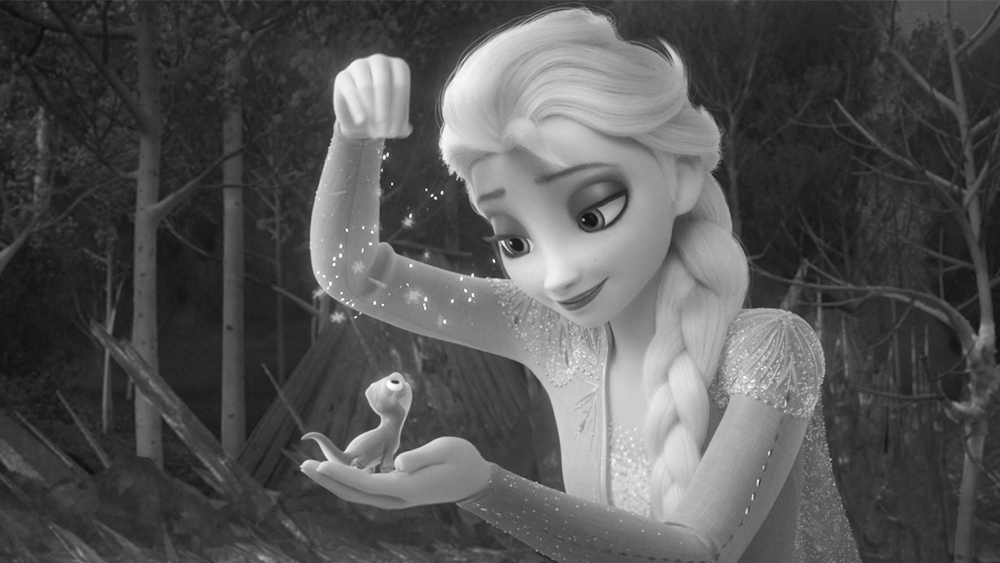

In [119]:
#we take the RGB image of frozen 
image_RGB2GRay=cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2GRAY) #  remember opencv reads image in BGR format 
#hence the string BGR2GRAY
cv2_imshow(image_RGB2GRay)

# Step 5: Histogram operations 


## Histogram of an image 

Histogram of an image gives an idea about the distribution of various pixel values. By going through the histogram, you get an intuition about contrast, brightness, intensity distribution etc of that image.



Visit this interesting link for more details: [Cambridge in color](https://www.cambridgeincolour.com/tutorials/histograms1.htm)

## Histogram computation of an image 

In order to compute histogram, we start with grayscale images and then proceed to RGB images.

### Histogram of a grayscale image 

We use the numpy functionality np.histogram to compute the histogram of grayscale image.



In [120]:
histogram, bin_edges = np.histogram(image_RGB2GRay, bins=256, range=(0, 255))

The parameter **bins** determines the size of the histogram. Since we want to compute the number of pixels for all the 256 possible pixel values, the number of bins is set to 256. Range determines the minimum to maximum possible values of pixels in the grayscale image.  

The first output of **np.histogram** provides a numpy array with 256 entries. Entry at index i (pixel value i) determines the number of pixels in the image having that pixel value i. We plot the histogram using matplotlib library. 

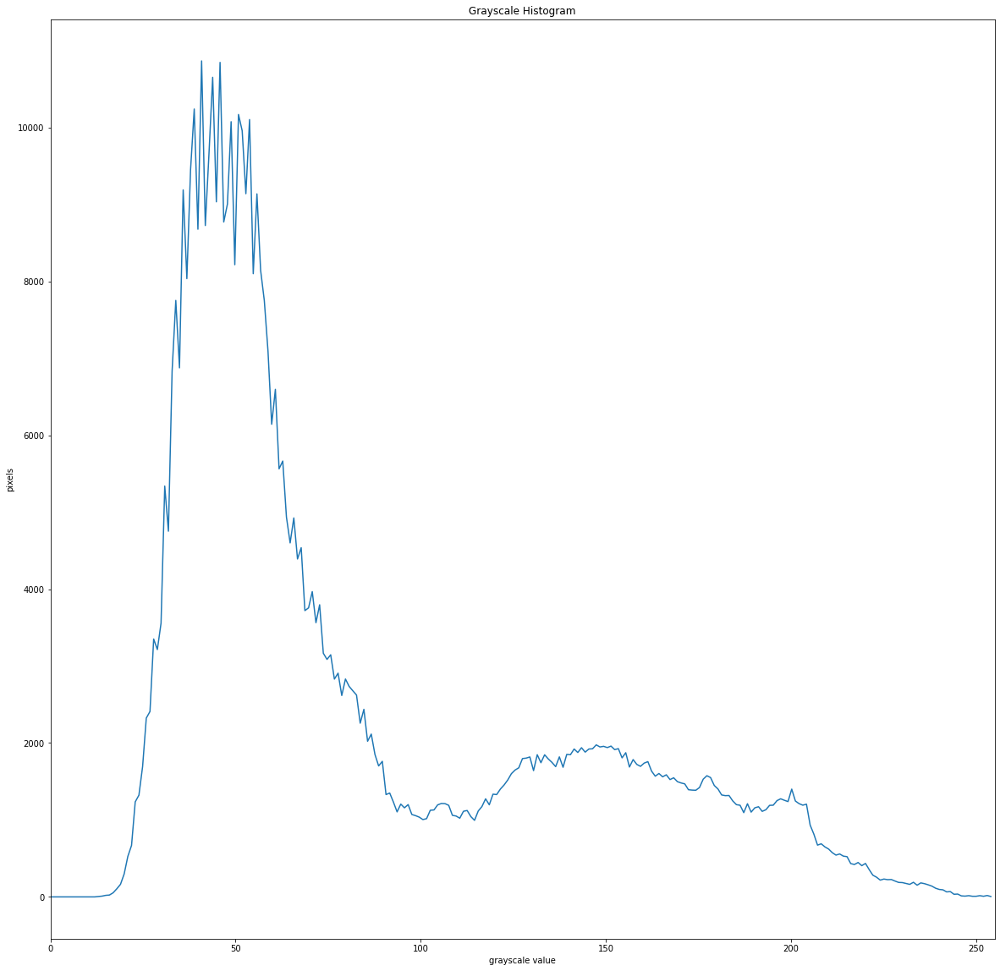

In [121]:
plt.figure() #create a new figure
plt.title("Grayscale Histogram") #title of the figure
plt.xlabel("grayscale value") #labels of the x axis 
plt.ylabel("pixels")# labels of the y axis 
plt.xlim([0, 255]) #limits of the x axis 
plt.plot(bin_edges[0:-1], histogram) #exact plot command
plt.show() # show the plot

### Histogram of a RGB image 

In order to plot the histogram of the RGB image, we plot histograms separately for each channel and plot them with different colors. 

**Remember**: OpenCV reads the image in a BGR format.



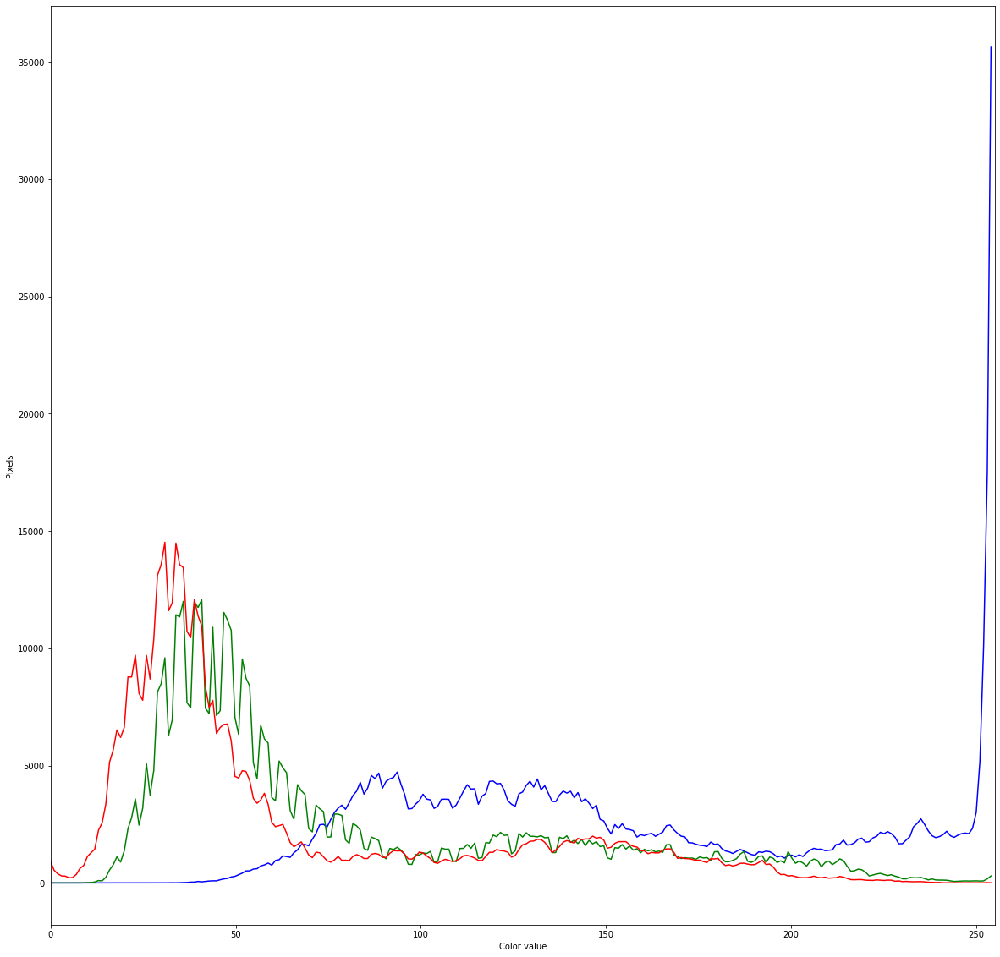

In [122]:
colors = ["b", "g", "r"] #specifying the color for each histogram 
channel_indices = [0, 1, 2] #specifying the index for each color
plt.xlim([0, 255])
for channel_id, c in zip(channel_indices, colors):
    histogram, bin_edges = np.histogram(
        image_RGB_data[:, :, channel_id], bins=256, range=(0, 255)
    ) #plotting the color histogram for the original frozen image
    plt.plot(bin_edges[0:-1], histogram, color=c)

plt.xlabel("Color value")
plt.ylabel("Pixels")
plt.show()

The RGB image 'frozen.jpg' has predominantly blue tone. So the histogram shows most of the blue channel pixel values(around 35000) at 255. 

## Histogram equalization of an image

Many images have pixel values confined to certain ranges. For example, a bright image will have all the pixels confined to the higher values and a dark image will have all the pixel values in the lower regions. A good well lit image will have pixel values across a wide range. Essentially, we need to stretch the histogram of the given image to cover a wide range of pixel values. Histogram equalization does the exact operation. It is shown in the following figure as a mapping T (Source link : [Opencv tutorial on histogram](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_histogram_equalization/py_histogram_equalization.html))

![picture](https://drive.google.com/uc?id=1VWDjpAUX7UYXZDKJwVjlQiOFp6OLCdoU)

Consider, $n_{j}$ is the number of pixels in the image having pixel values as $r_{j}$ and the dimensions of the image is given by $M \times N$. 
$L$ is the number of pixel intensity levels. Histogram equalization results in an updated pixel value $s_{k}$ for the original pixel value $r_{k}$. The relationship is given as below:
\begin{equation}
s_{k}=\frac{L-1}{MN} \sum_{j=0}^{k}{n_{j}}
\end{equation}


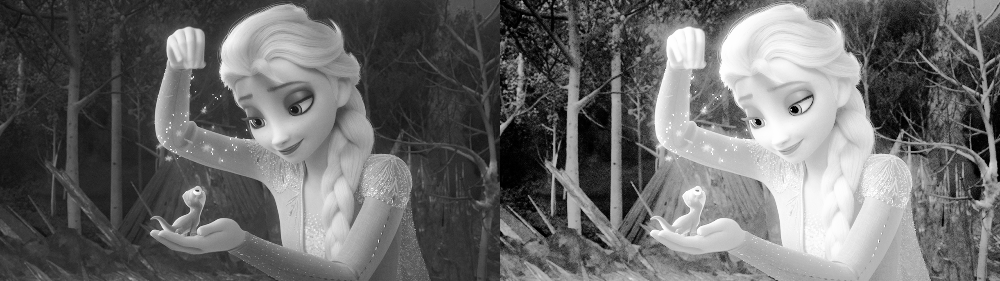

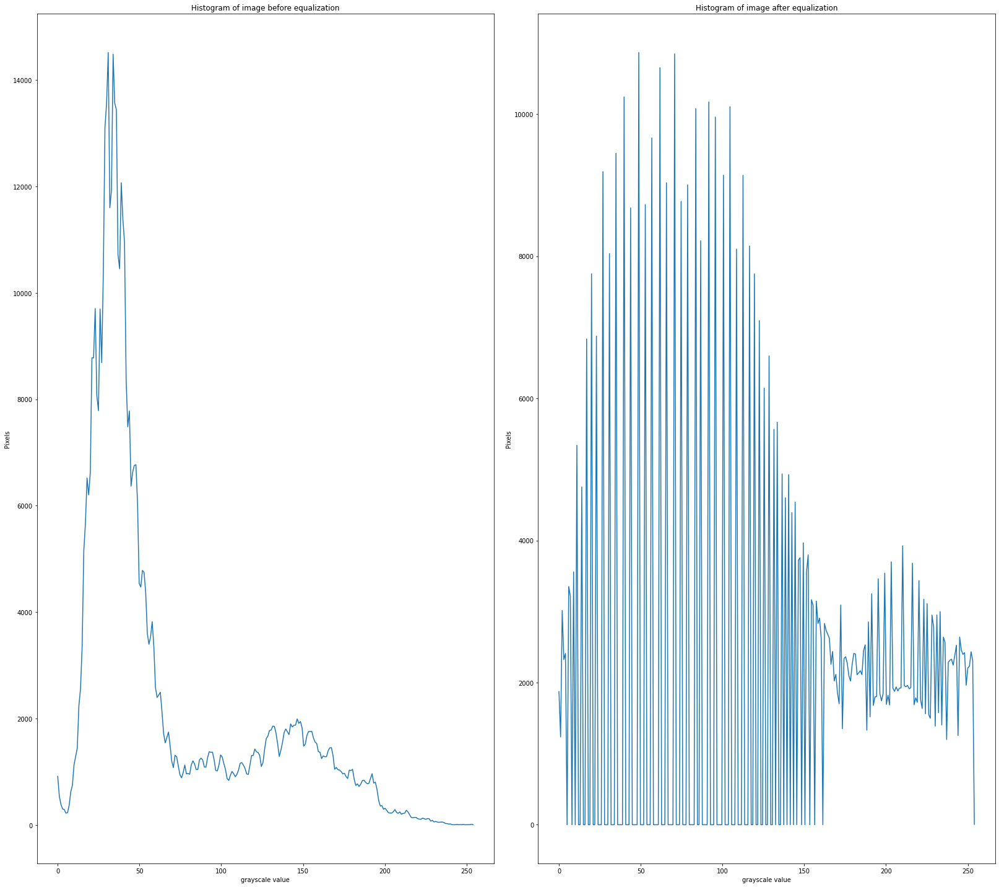

In [123]:
# function of histogram equalization
def histeq(im, n_bins = 256):  #actual implementation of histogram equalization
    """ Histogram equalization of a grayscale image.  """
    # get the image histogram
    imhist, bins = np.histogram(im.flatten(), n_bins, [0, 256])
    cdf = imhist.cumsum() # cumulative distribution function
    cdf = imhist.max()*cdf/cdf.max()  #normalize
    cdf_mask_part = np.ma.masked_equal(cdf, 0) #non masked part of cdf
    cdf_mask_part = ((cdf_mask_part - cdf_mask_part.min())/(cdf_mask_part.max()-cdf_mask_part.min()))*255
    cdf = np.ma.filled(cdf_mask_part,0).astype('uint8')
    return cdf[im.astype('uint8')]

im_hist_eq=histeq(image_RGB2GRay)
concatenated_images=cv2.hconcat((image_RGB2GRay,im_hist_eq))
cv2_imshow(concatenated_images)

#left image is the original grayscale image obtained from frozen's RGB image and right one is the image after histogram equalization



#using cv2 inbuilt library (another way to do histogram equalization)
image_BW_data2gray=cv2.cvtColor(image_BW_data,cv2.COLOR_BGR2GRAY)
image_BW_eq=cv2.equalizeHist(image_BW_data2gray)
concatenated_images_set=cv2.hconcat((image_BW_data2gray,image_BW_eq))
#cv2_imshow(concatenated_images_set)



#plot the histograms of previous image and the equalized image 
histogram_eq,bin_edge_eq=np.histogram(im_hist_eq.flatten(),256,[0,255])

plt.subplot(1,2,1)
plt.plot(bin_edges[0:-1], histogram)
plt.xlabel("grayscale value")
plt.ylabel("Pixels")
plt.title('Histogram of image before equalization')

plt.subplot(1,2,2)
plt.plot(bin_edge_eq[0:-1], histogram_eq)
plt.xlabel("grayscale value")
plt.ylabel("Pixels")
plt.title('Histogram of image after equalization')
plt.tight_layout()
plt.subplots_adjust(left=0.125,right=1.2)
plt.show()

# Step 6: Filtering images 


Filtering operations are used to remove outlier pixels or noise from the image and make the color transition across the image smooth. Filtering can also serve as inputs for other image related operations like edge detection etc. 


## Average Filtering 
For each pixel in the image, we average the pixel values of neighbors and the pixel itself and replace the previous pixel value with the average pixel value. The averaging operation is performed by defining a kernel area and replacing the central element with average of pixels under the kernel area. A $3 \times 3$ kernel is shown as below:
\begin{equation}
K=\
\begin{bmatrix}
1/9 & 1/9 & 1/9 \\
1/9 & 1/9 & 1/9 \\
1/9 & 1/9 & 1/9
\end{bmatrix}
\end{equation}
In opencv, we use the function cv2.blur.


In [124]:
@interact(kernel_size=widgets.IntSlider(min=3, max=15, step=2, value=3))
def blur_simulate(kernel_size):
  blur = cv2.blur(image_RGB_data,(kernel_size,kernel_size)) # 3 x 3 defines the above kernel here 
  concatenated_images=cv2.hconcat((image_RGB_data,blur))
  cv2_imshow(concatenated_images)

interactive(children=(IntSlider(value=3, description='kernel_size', max=15, min=3, step=2), Output()), _dom_cl…

## Median Filtering 

In case of median filtering, the median of all pixels under the kernel window is computed and the central pixel is replaced by a median value. This type of filtering is very useful in removing salt and pepper noise.



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


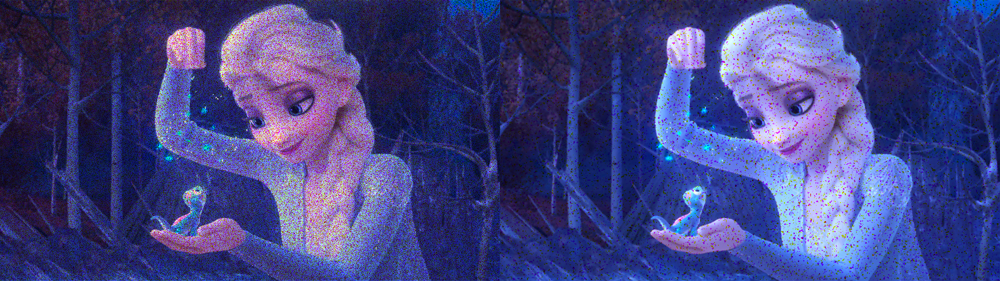

In [125]:
from copy import deepcopy
def add_salt_pepper_noise(image):
    #utility to add salt and pepper noise to the image
    row,col,ch = image.shape
    s_vs_p = 0.5
    amount = 0.20
    out = image.copy() # remember to make a copy here. Otherwise the original image will be changed
    # Salt mode
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
                    for i in image.shape]
    out[coords] = 1

    # Pepper mode
    num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
                    for i in image.shape]
    out[coords] = 0
    return out

noisy_RGB_data=add_salt_pepper_noise(image_RGB_data)
#hconcat_img=cv2.hconcat((image_RGB_data,out))


#apply median filtering 
median_filtered_image = cv2.medianBlur(noisy_RGB_data,3) #3 specifies the kernel size here
hconcat_img=cv2.hconcat((noisy_RGB_data,median_filtered_image))
cv2_imshow(hconcat_img)

# Step 7: Image Thresholding 


Useful link on image thresholding: [Image Thresholding](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_thresholding/py_thresholding.html)

Image thresholding is a form of image segmentation, where we change the pixel values of an image to make it easier to analyze. Fundamentally, we convert an image (grayscale or RGB) to a binary image (one which has only black and white pixels). A threshold is usually chosen for the pixel value. Any pixel value smaller than the threshold is set to 0 and any pixel value larger than the threshold is set to 255 or white.



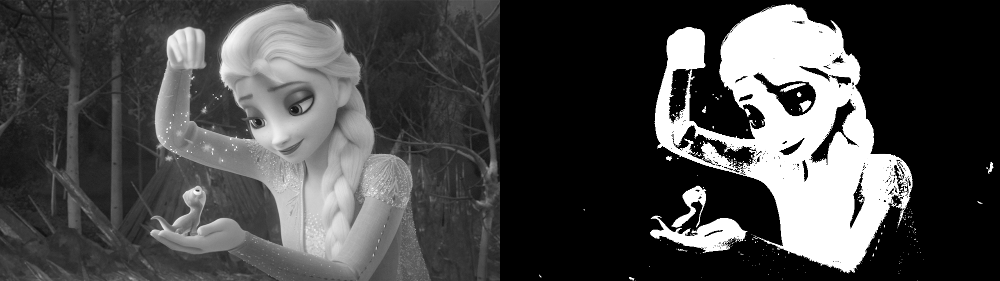

In [126]:
#consider the grayscale image for thresholding
ret,image_thresh=cv2.threshold(image_RGB2GRay,127,255,cv2.THRESH_BINARY)
#127: threshold used for image thresholding
#255: maximum value to be given to pixel if its value is greater than the threshold 
#cv2.THRESH_BINARY: type of thresholding
hconcat_img_thresh=cv2.hconcat((image_RGB2GRay,image_thresh))
cv2_imshow(hconcat_img_thresh)

# Step 8: Fun operations

Since a 8 bit grayscale image has values from 0 to 255, we can do an inversion and create a negative image by subtracting 255 from the original pixel values.


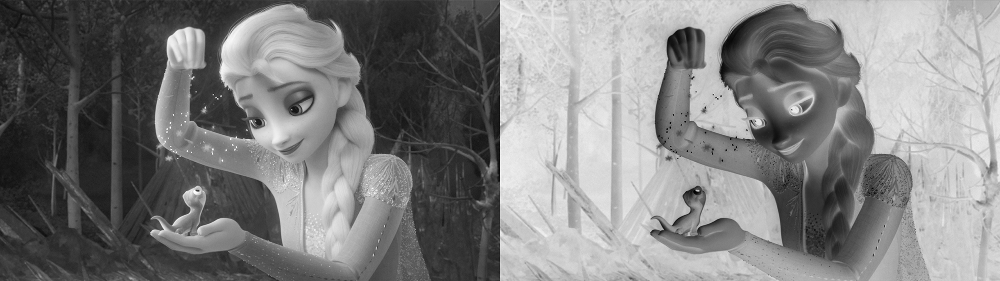

In [127]:
image_gray_neg=255-image_RGB2GRay #ghost image here !!!
hconcat_image_gray_set=cv2.hconcat((image_RGB2GRay,image_gray_neg)) 
cv2_imshow(hconcat_image_gray_set)

# Step 8: Edge detection

Edge detection is used to find the major boundaries or outlines of the objects in an image. It can be broadly used to identify the structures of objects in terms of the respective sizes, shapes and relative locations. Edges are regions in image where the brightness values change dramatically.
Useful reference: [Sobel edge detection](https://docs.opencv.org/3.4/d2/d2c/tutorial_sobel_derivatives.html)

## Sobel Edge detection

Sobel edge detection computes changes in the horizontal and vertical directions. The horizontal changes are computed using the following kernel $K_{x}$:

\begin{equation}
K_{x}=\
\begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
\end{equation}

For each pixel (pixel value given by $f(x,y)$) we apply the kernel on a 3 x 3 neighborhood centered on that pixel and replace the pixel value with the following value $G_{x}(x,y)$:
\begin{equation}
G_{x}(x,y)=[f(x+1,y-1)-f(x-1,y-1)]+2*[f(x+1,y)-f(x-1,y)]+[f(x+1,y+1)-f(x-1,y+1)]
\end{equation}

The vertical changes are computed using the following kernel $K_{y}$:

\begin{equation}
K_{y}=\
\begin{bmatrix}
1 & 2 & 1 \\
0 & 0 & 0 \\
-1 & -2 & -1
\end{bmatrix}
\end{equation}

For each pixel (pixel value given by $f(x,y)$) we apply the kernel on a 3 x 3 neighborhood centered on that pixel and replace the pixel value with the following value $G_{y}(x,y)$:
\begin{equation}
G_{y}(x,y)=[f(x-1,y-1)-f(x-1,y+1)]+2*[f(x,y-1)-f(x,y+1)]+[f(x+1,y-1)-f(x+1,y+1)]
\end{equation}

Now we have two images $G_{x}$ and $G_{y}$. The magntitude of the gradient is computed at each location using:
\begin{equation}
  G=\sqrt{G_{x}^{2}+G_{y}^2}
\end{equation}

After computing the values in the magnitude gradient image G, the pixel values are rounded off to values between 0 and 255. 

In opencv, we first remove noise by blurring (average filtering) the image and then run cv2.Sobel to compute the vertical and horizontal changes.



(563, 1000) (563, 1000)


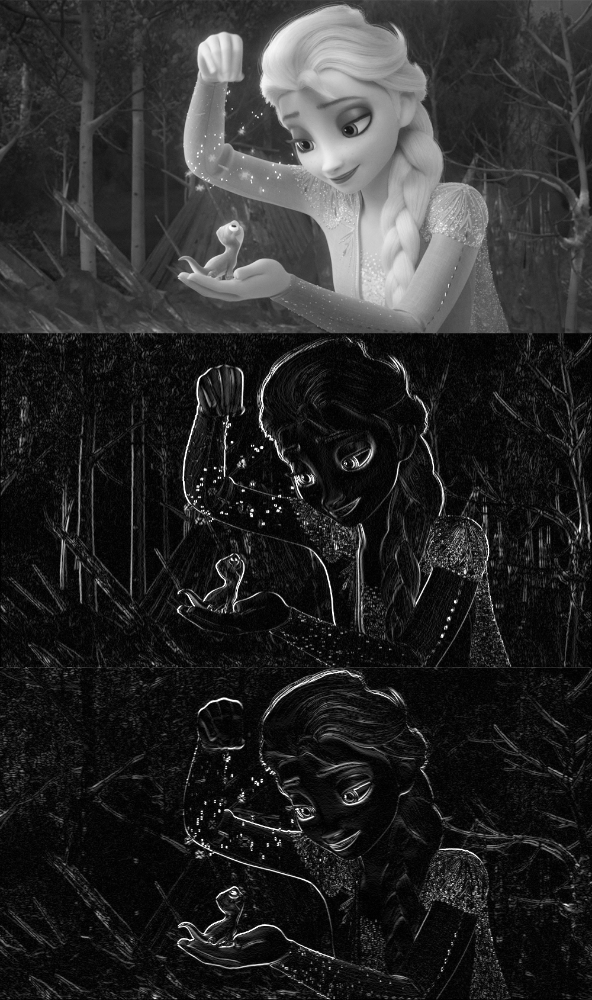

In [128]:
sobel_x_filtered_image = cv2.Sobel(image_RGB2GRay, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_filtered_image = cv2.Sobel(image_RGB2GRay, cv2.CV_64F, 0, 1, ksize=3)
sobel_x_filtered_image = cv2.convertScaleAbs(sobel_x_filtered_image)
sobel_y_filtered_image = cv2.convertScaleAbs(sobel_y_filtered_image)
print(sobel_x_filtered_image.shape,sobel_y_filtered_image.shape)
sobel_images=cv2.vconcat([image_RGB2GRay,sobel_x_filtered_image,sobel_y_filtered_image])

cv2_imshow(sobel_images)
#plot all three images in same fig 

## Canny Edge Detection

Canny Edge detection is an advanced edge detection algorithm that can generate edges in presence of noise. It was developed by John Canny in 1986. Unlike other edge detection algorithms, Canny edge detection algorithm is a multi-stage algorithm. The major steps followed in Canny Edge detection are as follows:



1.   **Reduce noise**:
      
      The first step involves filtering the image with 5 x 5 Gaussian filter to remove noise. The reason being noise pixels are amplified during edge detection.


2.   **Apply sobel edge detection for gradient intensity calculation**:

      Sobel edge detection is performed on the filtered image using kernels $K_{x}$ and $K_{y}$ to obtain gradient images $G_{x}(x,y)$ and $G_{y}(x,y)$. For each pixel, we compute the magnitude of the gradient ($G$) along with the angles ($\theta$) as follows:

    \begin{equation}
  G=\sqrt{G_{x}^{2}+G_{y}^2} \\
  \theta = tan^{-1}(\dfrac{G_{y}}{G_{x}})
    \end{equation}
      $\theta$ gives the direction of gradient and is always perpendicular to edges. The directions are usually rounded to one of four angles representing vertical, horizontal and two diagonal directions

3.  **Non maximum suppression**:

      Non maximum suppression removes unwanted pixels which are not part of any edge. A full scan of the entire image is done to check whether each pixel is a local maximum in its neighborhood in the direction of gradient. Check this picture given in [Opencv canny edge detection tutorial](http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_canny/py_canny.html):

      ![picture](https://opencv-python-tutroals.readthedocs.io/en/latest/_images/nms.jpg)
    
      Consider the gradient direction linking points A, B and C. Point A is on the edge. Point B and C are in gradient directions. If the edge magnitude value at A (value of $G$ at point A) is greater than the values at B and C, then the point A is a local maximum and retained as a part of edge. Otherwise it's value is set to zero. The result is a binary image with thin edges.

4.  **Thresholding with two levels**:

      This stage selects which edges are really edges and which are not required. Usually, we select two threshold values : a higher threshold value called maxVal and a lower threshold value minVal. If the magnitude value at a pixel is greater than maxVal, then they are considered as strong edges. The pixels for which the magnitude values are lesser than minVal are not assigned to any edges. Those pixels which lie between minVal and maxVal are classified as edges or non-edges based on their connectivity with other pixels which are part of sure edges. Usually **maxVal=2*minVal**.

Useful links for edge detection and Canny edge detection in general: 
*   [Canny Edge detection: Introduction](https://en.wikipedia.org/wiki/Canny_edge_detector)

*   [Canny Edge Detection: UMD CS Computer Vision](https://www.cs.umd.edu/class/fall2019/cmsc426-0201/files/11_CannyEdgeDetection.pdf)

*   [Edge Detection: UNC Chapell Hill Lectures](cs.unc.edu/~lazebnik/spring09/lec06_edge.pdf)


In [129]:
@interact(minVal=widgets.IntSlider(min=50, max=150, step=20, value=60),maxVal=widgets.IntSlider(min=100, max=200, step=20, value=100))
def canny_edge_detection(minVal,maxVal):
  image_copy_BW=image_RGB2GRay.copy()
  edges = cv2.Canny(image_copy_BW,threshold1=minVal,threshold2=maxVal)
  plt.rcParams['figure.figsize'] = [20, 20]
  plt.subplot(121),plt.imshow(image_copy_BW,cmap = 'gray')
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(edges,cmap = 'gray')
  plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
  plt.show()


interactive(children=(IntSlider(value=60, description='minVal', max=150, min=50, step=20), IntSlider(value=100…

# Step 9 : Image Features 

## SIFT Features

## HOG features 



# Step 10: Image Augmentation
Data Augmentation is a useful technique to increase the number of images 
available in a given dataset. Data Augmentation refer broadly to a set of image operations that increase the diversity of the images in a dataset by performing geometric/content-specific operations on the image array. It is a very useful technique for improving the size of datasets, while training a deep learning model. Common list of image augmentations are listed below:

1. Translation
2. Flipping
3. Rotation
4. Resizing
5. Cropping
6. Noise addition
7. Brightness increase 
8. Sharpen an image 

Useful reference for data augmentation: [Data Augmentation](https://neptune.ai/blog/data-augmentation-in-python)


Useful tool for data augmentation: [ImAug](https://github.com/aleju/imgaug/tree/master/imgaug/augmenters)






In [130]:
!pip install imgaug

## Translation



In [131]:


#alternative in opencv: use warpAffine function with matrix as [1,0,t_x;0,1,t_y]
@interact(shift=widgets.IntSlider(min=10, max=200, step=10, value=40),direction=widgets.Dropdown(options=['right','left','down','up'],value='up',description='Direction:',
    disabled=False))

def translate_image( shift, direction, roll=True):
    assert direction in ['right', 'left', 'down', 'up'], 'Directions should be top|up|left|right'
    img = image_RGB_data.copy()
    if direction == 'right':
        right_slice = img[:, -shift:].copy()
        img[:, shift:] = img[:, :-shift]
        if roll:
            img[:,:shift] = np.fliplr(right_slice)
    if direction == 'left':
        left_slice = img[:, :shift].copy()
        img[:, :-shift] = img[:, shift:]
        if roll:
            img[:, -shift:] = left_slice
    if direction == 'down':
        down_slice = img[-shift:, :].copy()
        img[shift:, :] = img[:-shift,:]
        if roll:
            img[:shift, :] = down_slice
    if direction == 'up':
        upper_slice = img[:shift, :].copy()
        img[:-shift, :] = img[shift:, :]
        if roll:
            img[-shift:,:] = upper_slice

    plt.rcParams['figure.figsize'] = [20, 20]
    plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.title('Translated Image'), plt.xticks([]), plt.yticks([])
    plt.show()

    #return img



interactive(children=(IntSlider(value=40, description='shift', max=200, min=10, step=10), Dropdown(description…

## Flipping

In [132]:

@interact(flip_code=widgets.Dropdown(options=[0,1,-1],value=0,description='Flip directions:'))
def flip_image(flip_code):
  img=image_RGB_data.copy()
  img_f=cv2.flip(img,flip_code)
  plt.rcParams['figure.figsize'] = [20, 20]
  plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(cv2.cvtColor(img_f,cv2.COLOR_BGR2RGB))
  plt.title('Flipped Image'), plt.xticks([]), plt.yticks([])
  plt.show()





interactive(children=(Dropdown(description='Flip directions:', options=(0, 1, -1), value=0), Output()), _dom_c…

## Rotation

In [133]:
@interact(rot_angle=widgets.IntSlider(min=10, max=180, step=10, value=20,description='Rotation angle:'))
def rotate_image(rot_angle):
  img=image_RGB_data.copy()
  height,width,ch=img.shape
  matrix = cv2.getRotationMatrix2D((height/2, width/2), rot_angle, 1)
  rotated = cv2.warpAffine(img, matrix, (img.shape[1], img.shape[0]))
  plt.rcParams['figure.figsize'] = [20, 20]
  plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(cv2.cvtColor(rotated,cv2.COLOR_BGR2RGB))
  plt.title('Rotated Image'), plt.xticks([]), plt.yticks([])
  plt.show()




interactive(children=(IntSlider(value=20, description='Rotation angle:', max=180, min=10, step=10), Output()),…

## Resizing

In [134]:
@interact(w=widgets.IntSlider(min=100,max=500,step=50,value=200),h=widgets.IntSlider(min=100,max=500,step=50,value=200))
def resize_image(w,h):
  img=image_RGB_data.copy()
  resized_img=cv2.resize(img,(w,h))
  plt.rcParams['figure.figsize'] = [20, 20]
  plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB))
  plt.title('Resized Image'), plt.xticks([]), plt.yticks([])
  plt.show()



interactive(children=(IntSlider(value=200, description='w', max=500, min=100, step=50), IntSlider(value=200, d…

## Cropping



In [135]:

@interact(crop_height=widgets.IntSlider(min=32,max=256,step=16,value=64),crop_width=widgets.IntSlider(min=32,max=256,step=16,value=64))

def get_random_crop(crop_height, crop_width):

    image = image_RGB_data.copy()
    max_x = image.shape[1] - crop_width
    max_y = image.shape[0] - crop_height

    x = np.random.randint(0, max_x)
    y = np.random.randint(0, max_y)

    crop = image[y: y + crop_height, x: x + crop_width]

    plt.rcParams['figure.figsize'] = [20, 20]
    plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv2.cvtColor(crop,cv2.COLOR_BGR2RGB))
    plt.title('Random crop image'), plt.xticks([]), plt.yticks([])
    plt.show()



interactive(children=(IntSlider(value=64, description='crop_height', max=256, min=32, step=16), IntSlider(valu…

## Add noise 

Noise augmentation can be performed by adding different types of noise like: gaussian noise, salt and pepper noise and poisson noise.

### Salt and pepper noise

In [136]:
from skimage.util import random_noise
@interact(amount=widgets.FloatSlider(min=0.01,max=0.20,step=0.01))

def add_salt_pepper_noise(amount):
  image=image_RGB_data.copy()
  noise = random_noise(image, mode='s&p', amount=amount)
  noise = np.array(255 * noise, dtype=np.uint8)
  plt.rcParams['figure.figsize'] = [20, 20]
  plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(cv2.cvtColor(noise,cv2.COLOR_BGR2RGB))
  plt.title('Image with salt and pepper noise'), plt.xticks([]), plt.yticks([])
  plt.show()

interactive(children=(FloatSlider(value=0.01, description='amount', max=0.2, min=0.01, step=0.01), Output()), …

### Gaussian noise 



In [137]:
from skimage.util import random_noise
@interact(mean=widgets.FloatSlider(min=0,max=125.0,step=1.0),var=widgets.FloatSlider(min=0.01,max=2.0,step=0.05))
def add_gaussian_noise(mean,var):
    image=image_RGB_data.copy()
    noise = random_noise(image, mode='gaussian', mean=mean,var=var)
    noise = np.array(255 * noise, dtype=np.uint8)
    plt.rcParams['figure.figsize'] = [20, 20]
    plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv2.cvtColor(noise,cv2.COLOR_BGR2RGB))
    plt.title('Image with gaussian noise'), plt.xticks([]), plt.yticks([])
    plt.show()

interactive(children=(FloatSlider(value=0.0, description='mean', max=125.0, step=1.0), FloatSlider(value=0.01,…

## Brightness increase 
Increase the brightness of image by adding values to hsv channel.

In [138]:
#we use the color jittering 

@interact(value=widgets.FloatSlider(min=0.5,max=5,step=0.1))
def increase_brightness(value):
  image=image_RGB_data.copy()
  hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
  val=hsv[:,:,2]
  val=val*value
  val[val>255]=255
  val[val<255]=0
  hsv[:,:,2]=val
  image_ch = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
  plt.rcParams['figure.figsize'] = [20, 20]
  plt.subplot(121),plt.imshow(cv2.cvtColor(image_RGB_data,cv2.COLOR_BGR2RGB))
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(image_ch)
  plt.title('Image with varying brightness'), plt.xticks([]), plt.yticks([])
  plt.show()

interactive(children=(FloatSlider(value=0.5, description='value', max=5.0, min=0.5), Output()), _dom_classes=(…

Possible topics:

Initial set: Image formats

1. Histogram equalization
2. Edge detection: Canny, Sobel
3. Filtering: Average Filtering, Median Filtering, Bilateral filtering
4. Thresholding
5. General augmentation: flipping, cropping, noise addition
6. SIFT/HOG/SURF
7. Video loading/handling
8. FFmpeg examples (codec, failures)
9. shot detection
10. Video augmentation


# Step 11: Video processing 

## Introduction:

Video is essentially a series of images called frames, with each frame associated with a time instant. The following picture of Kineograph(Zeitgenössische Illustration (1886)) gives a rudimentary idea about videos.

![Picture](https://drive.google.com/uc?id=1K6vnFF4GjxklWZO86XuylBEDLLiOneps)



      



## Video Formats
Video information is usually stored in different types of file formats called video formats. In order to preserve space, most of the videos are stored in a lossy manner. Common video formats are listed below:
  *   **AVCHD(Advanced video coding high definition)**: Devloped by Sony and Panasonic. Useful for professional photographers. 
  *   **AVI(Audio Video Interleave)**:
  *   **FLV(Flash Video Format)**:
  *   **MKV(Matroska)**: MKV, or matroska, is a free and open-source format. Often used as a standard video format for common multimedia files, such as shows and movies. 
  *  **MOV**: MOV is Apple’s QuickTime Movie format. It allows videographers to break down the file into diverse tracks for the storage of different types of data.
  * **MP4**: MP4 is another commonly used file format that can store videos, subtitles and images. It was popularized by iTunes and Xbox 360.

Overview link for video formats: [Video Formats](https://www.wix.com/blog/photography/2018/10/25/video-formats/)

## Video terminologies

  1. **Frame**: Each individual image in a video at specific time point.

  2. **Frame rate**: The number of frames per second at which a video clip is displayed. Frame rate=25 translates to 25 frames per second or each frame taking 0.04 second.
  3. **Aspect ratio**: The ratio of width to height for a frame of the video.

  4. **Codec**: Codec refers to the software that compresses or decompresses the video. Example: H.264 is the most widely used codec now. It drives all our streaming services like Netflix, Prime, iTunes etc. For audio, we have the audio codec as aac.

  5. **Container**: Container is the wrapper around the actual content and contains all the audio and video data along with information like title, resolution etc. The various file formats i.e. MP4, MKV are the respective containers.


An example of video called video.mp4 is shown, where the container is mp4 or mpeg4 and the respective audio and video codecs are aac and h264.

![Picture](https://drive.google.com/uc?id=1cKx9Zn2ChD_cPc71Fphp5L6Kpu_jbRal)




## Effects of Frame Rates:

In this part, we show the impact of variable frame rates on the same video clip. 
We first show one video clip at normal speed(native frame rate i.e. 24 fps).


Interesting article on Frame Rate: [Why 24 frames per second?](https://www.filmindependent.org/blog/hacking-film-24-frames-per-second/)

In [1]:


from IPython.display import HTML
data_url="https://drive.google.com/uc?id=1aCTOH7AV3RZoul23FDe_-a9o7B-7nKMk"
HTML("""
<video width=1000 controls>
      <source src="%s" type="video/mp4">. 
</video>
""" % data_url) #displaying the video at the same frame rate (slower video)

We show the same video clip at twice the normal speed (double frame rate i.e. 48 fps).

In [2]:
data_url="https://drive.google.com/uc?id=1annA-D51l6Ncy9Jaadmz1ueDU1AQRM9G"
HTML("""
<video width=1000 controls>
      <source src="%s" type="video/mp4">.
</video>
""" % data_url) #displaying the video at twice the frame rate (faster video)

We show the same video clip at half the normal speed (half of native frame rate i.e. 12 fps)

In [7]:
data_url="https://drive.google.com/uc?id=1sgmTbnaRVH_CBNuzaS5FfFR9hXMJnE9l"
HTML("""
<video width=1000 controls>
      <source src="%s" type="video/mp4">.
</video>
""" % data_url)

## FFMPEG - your friend while handling multimedia data

FFmpeg is a complete, cross-platform software to record, convert and stream audio and video. It started in 2000 and still undergoing upgrades. [Chrome](https://www.chromium.org/developers/design-documents/video) uses FFmpeg in the backend. A common usage of ffmpeg occurs through the command line utility **ffmpeg**.



1.   ffmpeg list information of video
2.   ffmpeg convert between video files 
3.   ffmpeg recode video with higher/slowe
5.   ffmpeg merge two video files


Hands-on Tutorials on FFMPEG:

*   [Werner Robitza's tutorial on FFMPEG](http://slhck.info/ffmpeg-encoding-course/#/)
*   [ffmpeg-libav-tutorial](https://github.com/leandromoreira/ffmpeg-libav-tutorial#intro)



## Handling video using OpenCV

